## Observation from the Open City Nature Challange 

RQ1 
Can we identify macroscopic laws of citizen science projects so that long term dynamics is different? 

RQ2 
How communities are growing in time, what drives their growth if not preferential attachment or exogeneous factors?

## Data 
Muki downloaded all the CNC observations for the bounding box of Europe (metadata below) that includes the geographical locations - it's 62K observations.

Query quality_grade=any&identifications=any&swlat=35.327868&swlng=-15.438348&nelat=61.352386&nelng=32.898351&projects[]=city-nature-challenge-2019
Columns id, observed_on_string, observed_on, time_observed_at, time_zone, out_of_range, user_id, user_login, created_at, updated_at, quality_grade, license, url, image_url, sound_url, tag_list, description, id_please, num_identification_agreements, num_identification_disagreements, captive_cultivated, oauth_application_id, place_guess, latitude, longitude, positional_accuracy, geoprivacy, taxon_geoprivacy, coordinates_obscured, positioning_method, positioning_device, species_guess, scientific_name, common_name, iconic_taxon_name, taxon_id, taxon_kingdom_name, taxon_phylum_name, taxon_subphylum_name, taxon_superclass_name, taxon_class_name, taxon_subclass_name, taxon_superorder_name, taxon_order_name, taxon_suborder_name, taxon_superfamily_name, taxon_family_name, taxon_subfamily_name, taxon_supertribe_name, taxon_tribe_name, taxon_subtribe_name, taxon_genus_name, taxon_genushybrid_name, taxon_species_name, taxon_hybrid_name, taxon_subspecies_name, taxon_variety_name, taxon_form_name

We will focus in particular on data from UK and in particular on London (51.5074° N, 0.1278° W). 
Shape of the data is 62246, 58.

In [1]:

import plotly.plotly as py
import plotly.graph_objs as go
import pandas as pd
import csv


# load data on trajectories, it is very heavy 

df_cit_sci = pd.read_csv('C:/Users/lyubo/Documents/DATA_networks/data_citizen_science/observations-65163_space.csv')

print(df_cit_sci.shape)


(62246, 58)


C:\Users\lyubo\Anaconda3\envs\default\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning:

Columns (14) have mixed types. Specify dtype option on import or set low_memory=False.



In [2]:
df_cit_sci.head(10)

,id,observed_on_string,observed_on,time_observed_at,time_zone,out_of_range,user_id,user_login,created_at,updated_at,...,taxon_supertribe_name,taxon_tribe_name,taxon_subtribe_name,taxon_genus_name,taxon_genushybrid_name,taxon_species_name,taxon_hybrid_name,taxon_subspecies_name,taxon_variety_name,taxon_form_name
0,22076774,2019-04-27 2:20:57 odp. SELČ,2019-04-27,2019-04-27 14:20:57 UTC,UTC,NaN,1583433,vladimrkivka,2019-04-06 12:24:09 UTC,2019-05-02 14:04:48 UTC,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,22076799,2019-04-27 2:25:49 odp. SELČ,2019-04-27,2019-04-27 14:25:49 UTC,UTC,NaN,1583433,vladimrkivka,2019-04-06 12:26:20 UTC,2019-05-02 14:05:06 UTC,...,NaN,Astereae,NaN,Bellis,NaN,Bellis perennis,NaN,NaN,NaN,NaN
2,22277087,2019-04-28 12:01:16 pm BST,2019-04-28,2019-04-28 12:01:16 UTC,UTC,NaN,1595601,louisaroscoe,2019-04-10 11:05:41 UTC,2019-04-28 16:53:29 UTC,...,NaN,Cichorieae,Crepidinae,Taraxacum,NaN,Taraxacum officinale,NaN,NaN,NaN,NaN
3,22364809,2019-04-28 12:09:02 pm BST,2019-04-28,2019-04-28 12:09:02 UTC,UTC,NaN,1595601,louisaroscoe,2019-04-12 11:52:54 UTC,2019-04-28 16:53:02 UTC,...,NaN,Primuleae,NaN,Primula,NaN,Primula veris,NaN,NaN,NaN,NaN
4,22605691,2019-04-28 3:02:10 pm BST,2019-04-28,2019-04-28 15:02:10 UTC,UTC,NaN,1595601,louisaroscoe,2019-04-17 14:02:21 UTC,2019-05-14 07:05:53 UTC,...,NaN,NaN,NaN,Nepa,NaN,Nepa cinerea,NaN,NaN,NaN,NaN
5,22606216,2019-04-28,2019-04-28,NaN,UTC,NaN,1595601,louisaroscoe,2019-04-17 14:15:59 UTC,2019-05-14 07:05:10 UTC,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,22806411,2019-04-26 8:28:00 dop. SELČ,2019-04-26,2019-04-26 08:28:00 UTC,UTC,NaN,1583241,ditush,2019-04-21 09:56:05 UTC,2019-05-05 12:36:47 UTC,...,NaN,Maleae,NaN,Malus,NaN,NaN,NaN,NaN,NaN,NaN
7,22933191,2019-04-28,2019-04-28,NaN,UTC,NaN,1595601,louisaroscoe,2019-04-23 09:16:15 UTC,2019-05-14 07:14:41 UTC,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,22992173,2019-04-28 1:02:28 pm BST,2019-04-28,2019-04-28 13:02:28 UTC,UTC,NaN,1595601,louisaroscoe,2019-04-24 12:03:25 UTC,2019-04-28 16:47:41 UTC,...,NaN,Cariceae,NaN,Carex,NaN,NaN,NaN,NaN,NaN,NaN
9,23047204,Fri Apr 26 2019 09:00:12 GMT+0100 (GMT+1),2019-04-26,2019-04-26 07:00:12 UTC,Amsterdam,NaN,1598624,lucyvesely,2019-04-25 13:05:03 UTC,2019-04-26 13:48:14 UTC,...,NaN,Bombini,NaN,Bombus,NaN,Bombus hortorum,NaN,NaN,NaN,NaN


In [2]:

print(df_cit_sci.columns)

Index(['id', 'observed_on_string', 'observed_on', 'time_observed_at',
       'time_zone', 'out_of_range', 'user_id', 'user_login', 'created_at',
       'updated_at', 'quality_grade', 'license', 'url', 'image_url',
       'sound_url', 'tag_list', 'description', 'id_please',
       'num_identification_agreements', 'num_identification_disagreements',
       'captive_cultivated', 'oauth_application_id', 'place_guess', 'latitude',
       'longitude', 'positional_accuracy', 'geoprivacy', 'taxon_geoprivacy',
       'coordinates_obscured', 'positioning_method', 'positioning_device',
       'species_guess', 'scientific_name', 'common_name', 'iconic_taxon_name',
       'taxon_id', 'taxon_kingdom_name', 'taxon_phylum_name',
       'taxon_subphylum_name', 'taxon_superclass_name', 'taxon_class_name',
       'taxon_subclass_name', 'taxon_superorder_name', 'taxon_order_name',
       'taxon_suborder_name', 'taxon_superfamily_name', 'taxon_family_name',
       'taxon_subfamily_name', 'taxon_supertribe_

### Plot data about participants and findings on a map

From 62246 unique records of users we plot their distribution on a map.

C:\Users\lyubo\Anaconda3\envs\default\lib\site-packages\ipykernel_launcher.py:18: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.

C:\Users\lyubo\Anaconda3\envs\default\lib\site-packages\ipykernel_launcher.py:18: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



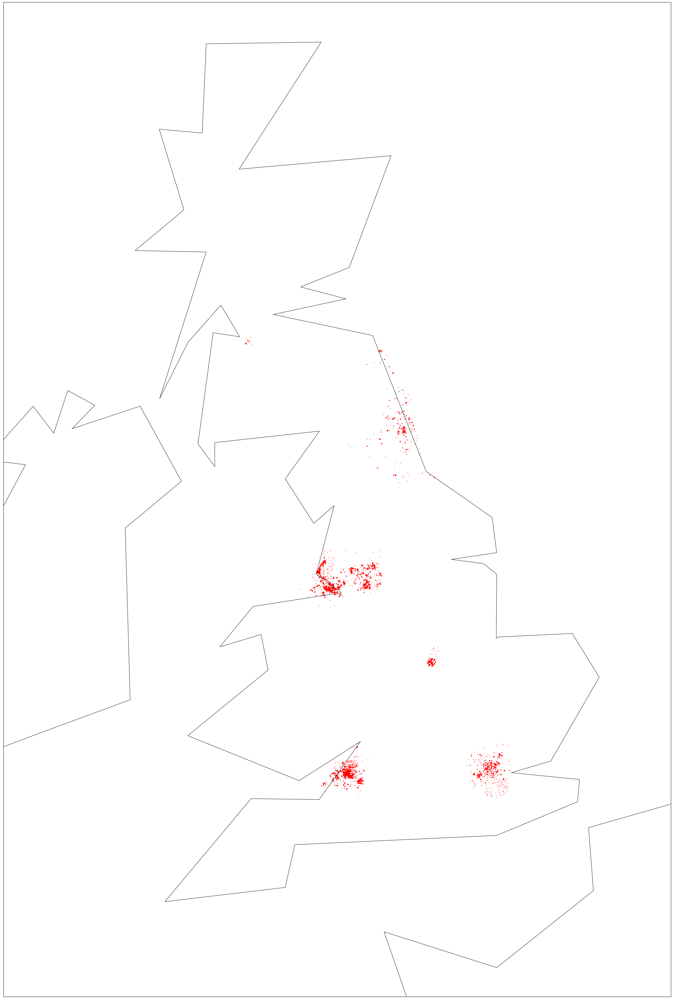

In [9]:

import math
import matplotlib.pyplot as plt

import seaborn
from mpl_toolkits.basemap import Basemap

# setup Lambert Conformal basemap.
# set resolution=None to skip processing of boundary datasets.
# Create a map on which to draw. 
# Use mercator projection, and showing the whole world.

fig, ax = plt.subplots(figsize=(60, 60))

# Berlin Latitude: 52.520008, longitude: 13.404954.
# NYC  40.730610, and the longitude is -73.935242.
# We want to plot only Berlin surrounding areas
m = Basemap(projection='merc',llcrnrlat=49,urcrnrlat=59,llcrnrlon=-8.5,urcrnrlon=3,lat_ts=20,resolution='c')
# Draw coastlines, and the edges of the map. NASA bluemarble
m.shadedrelief() #m.bluemarble()
m.drawcoastlines()
m.drawmapboundary()

# Convert latitude and longitude to x and y coordinates
#TODO: verify if x and y correspond well to lon, lat
x, y = m(list(df_cit_sci["longitude"].astype(float)), list(df_cit_sci["latitude"].astype(float)))

#print(type(x))

# Use matplotlib to draw the points onto the map.
m.scatter(x,y,1,marker='o',color='red')
# Show the plot.
plt.show()

 
 # Plot points of data on a map with geometry
Using osmnx module we want to plot trajectories on a map 

Work in progress on 
 1. visualisation of the spatial patterns over time
 2. analysis of communities formations and population of the platform over time

In [2]:


import folium


#first we get datapoints from the file
latitude = df_cit_sci.latitude.values
longitude = df_cit_sci.longitude.values

#then we zip two arrays of lat, lon of datapoints
latlon = list(zip(latitude, longitude))
#print(latlon)


In [4]:

#We put map to show first location of London latitude 51.5074° N, longitude 0.1278° W

mapit = folium.Map( location=[51.5074 , 0.1278]) #, zoom_start=6 
for coord in latlon:
    folium.Marker( location=[ coord[0], coord[1] ], fill_color='#43d9de', radius=8 ).add_to( mapit )
mapit


#draw connecting line between locations written in latlon file



#if we need to plot trajectories on a map
#SAF=folium.PolyLine(locations=latlon,weight=5,color = 'red')
#mapit.add_child(SAF)

In [5]:
#saving a map
mapit.save('map_citscience.html')

